In [1]:
# Load necessary libraries
import sys
import os
import anndata as ad
import pandas as pd
import scanpy as sc
import seaborn as sns; sns.set(color_codes=True)
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white', dpi_save=200)

scanpy==1.9.1 anndata==0.7.8 umap==0.5.2 numpy==1.21.5 scipy==1.6.0 pandas==1.3.5 scikit-learn==0.24.2 statsmodels==0.13.2 pynndescent==0.5.6


In [3]:
adata=sc.read_h5ad('data/figure7_mg_raw.h5ad')

In [4]:
adata.obs

,spatial_X,spatial_Y,Area,Area (µm^2),ImageID,ImageType,Parent,Distance to nearest Plaque (µm),numCellCentroids,Region
1790,13574.364621,11980.732852,277,61.1722,Ctl-3,Ctl,Grey Matter,348.1208,1.0,GM
1794,13491.046358,11876.990066,302,53.9108,Ctl-3,Ctl,Grey Matter,308.6889,1.0,GM
1795,14676.054795,11854.070776,438,82.4693,Ctl-3,Ctl,Grey Matter,432.9919,1.0,GM
1796,13395.029412,11854.349790,952,185.9480,Ctl-3,Ctl,Grey Matter,303.5456,1.0,GM
1797,15292.282609,11814.693237,828,171.9872,Ctl-3,Ctl,Grey Matter,353.9196,1.0,GM
...,...,...,...,...,...,...,...,...,...,...
143982,39.883575,15885.947766,1589,269.7662,Ctl-2,Ctl,White Matter,NaN,1.0,WM
143983,331.334215,15758.689594,1134,204.2505,Ctl-2,Ctl,White Matter,NaN,1.0,WM
143986,140.715271,15603.225616,1015,172.7699,Ctl-2,Ctl,White Matter,NaN,1.0,WM
143987,129.878453,15529.645304,1810,347.2530,Ctl-2,Ctl,White Matter,NaN,1.0,WM


In [5]:
sc.pp.log1p(adata)
sc.pp.combat(adata, key='ImageID', inplace=True)
adataScaled=sc.pp.scale(adata, max_value=10, copy=True)


Standardizing Data across genes.

Found 8 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



In [6]:
#set spatial coordinates
adataScaled.obsm['X_spatial'] = adataScaled.obs[['spatial_X','spatial_Y']].values
adataScaled.obsm['X_spatial'][:,1] = -1*adataScaled.obsm['X_spatial'][:,1]

In [7]:
sc.tl.pca(adataScaled, svd_solver='arpack') # peform PCA


computing PCA
    with n_comps=9
    finished (0:00:00)


In [8]:
sc.tl.tsne(adataScaled, perplexity=100)


computing tSNE
    using data matrix X directly
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:03:20)


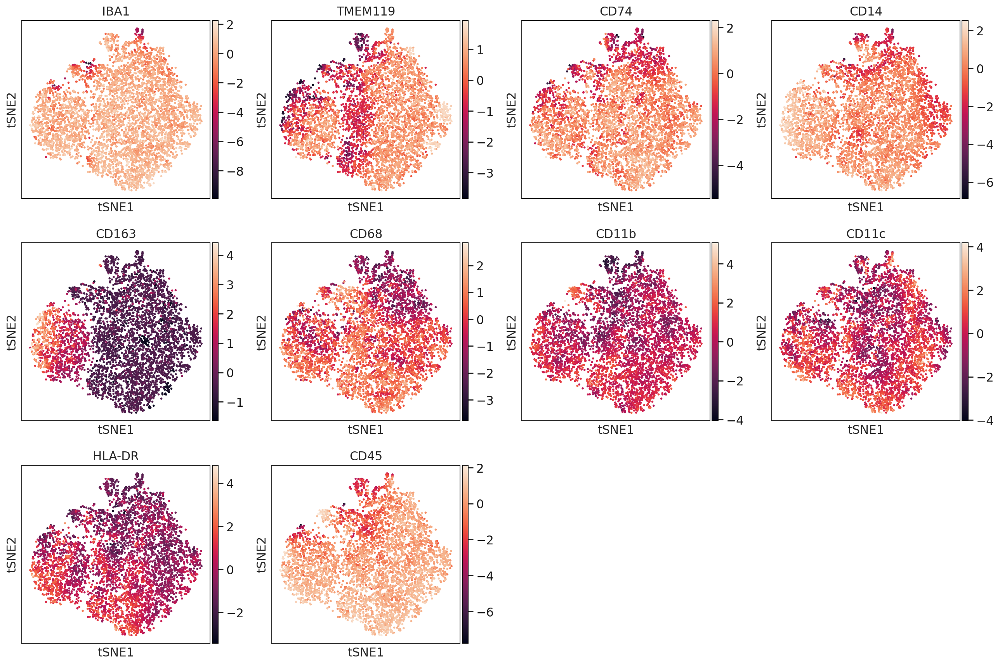

In [9]:
sc.pl.tsne(sc.pp.subsample(adataScaled,fraction=0.1, copy=True), color=adataScaled.var_names,use_raw=False)

In [10]:
# compute clustering phenotypes
# uses RapidsAI to speed-up the computation
import rapids_scanpy_funcs as rs

sc.pp.neighbors(adataScaled, n_neighbors=100, method='rapids') # Computing the neighborhood graph
adataScaled.obs['leiden'] = rs.leiden(adataScaled, resolution=1.0)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:16)


In [11]:
adataScaled.write_h5ad('data/figure7_mg_clusters.h5ad')

In [12]:
adataScaled.obs.to_csv('data/figure7_clusters.csv')

In [13]:
# Read-in to avoid computing clusters each time
adataScaled = sc.read_h5ad('data/figure7_mg_clusters.h5ad')

In [14]:
# set colors for leiden clusters
cMapDict = {0: '#1f77b4',
 1: '#ff7f0e',
 2: '#279e68',
 3: '#d62728',
 4: '#aa40fc',
 5: '#8c564b',
 6: '#e377c2',
 7: '#b5bd61',
 8: '#17becf',
 9: '#aec7e8',
 10: '#ffbb78'}

Text(771.6729166666664, 0.5, 'tSNE2')

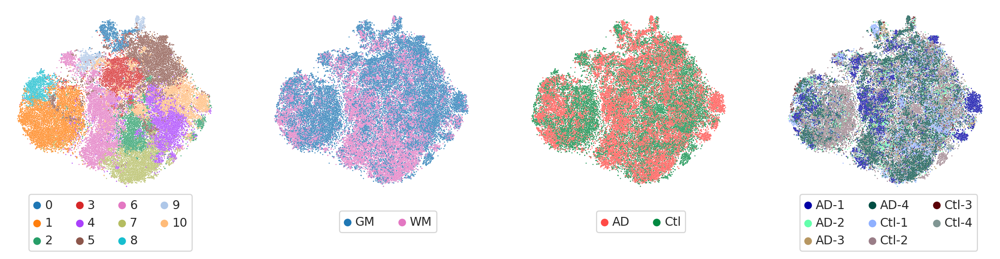

In [15]:
sc.settings.set_figure_params(dpi_save=300, facecolor='white',figsize=(5,4))
sns.set(font="Arial")

sns.set_style('white')
#sc.pl.tsne(adataScaled, color=['leiden','ImageTypev2','ImageType'], size=2,ncols=3,sort_order=False, save='_umapsV4.png')
fig,ax=plt.subplots(1,4, figsize=(13,3.5))
sns.scatterplot(data=adataScaled.obs, x=adataScaled.obsm['X_tsne'][:,0], y=adataScaled.obsm['X_tsne'][:,1],ax=ax[0],
                hue='leiden', palette=cMapDict,s=1,)
ax[0].legend(ncol=4,loc=(0.1,-0.3))
ax[0].axis('off')
ax[0].set_xlabel('tSNE1')
ax[0].set_ylabel('tSNE2')
sns.scatterplot(data=adataScaled.obs, x=adataScaled.obsm['X_tsne'][:,0], y=adataScaled.obsm['X_tsne'][:,1],ax=ax[1],
                hue='Region',s=1, palette=['tab:blue','tab:pink'], hue_order=['GM','WM'])
ax[1].axis('off')
ax[1].set_xlabel('tSNE1')
ax[1].set_ylabel('tSNE2')
ax[1].legend(ncol=4,loc=(0.35,-0.2))
plt.tight_layout()

sns.scatterplot(data=adataScaled.obs, x=adataScaled.obsm['X_tsne'][:,0], y=adataScaled.obsm['X_tsne'][:,1],ax=ax[2],
                hue='ImageType',s=1,palette=sc.pl.palettes.godsnot_102[3:5], hue_order=['AD','Ctl'])
ax[2].axis('off')
ax[2].set_xlabel('tSNE1')
ax[2].set_ylabel('tSNE2')

ax[2].legend(ncol=4,loc=(0.35,-0.2))
plt.tight_layout()



sns.scatterplot(data=adataScaled.obs, x=adataScaled.obsm['X_tsne'][:,0], y=adataScaled.obsm['X_tsne'][:,1],ax=ax[3],
                hue='ImageID', palette=sc.pl.palettes.godsnot_102[9:17],s=1,  hue_order=sorted(list(adataScaled.obs['ImageID'].unique()))
)
ax[3].legend(ncol=3,loc=(0.1,-0.3))
ax[3].axis('off')
ax[3].set_xlabel('tSNE1')
ax[3].set_ylabel('tSNE2')


    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden']`


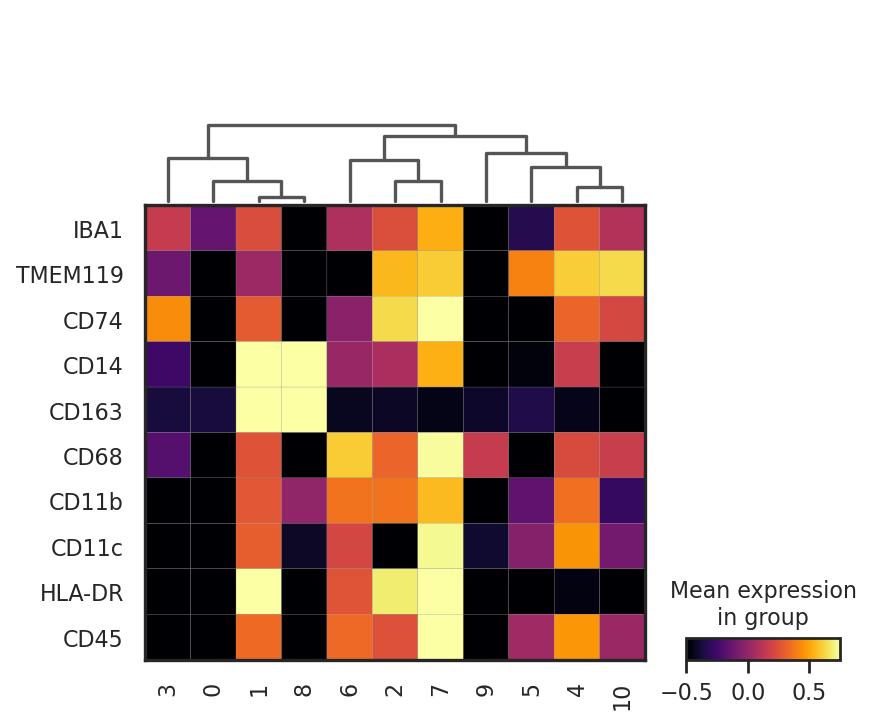

In [16]:
# Plot heatmap

sc.tl.dendrogram(adataScaled, groupby='leiden')
sc.pl.matrixplot(adataScaled, var_names = adataScaled.var_names,groupby='leiden', 
                 dendrogram=True, use_raw=False, cmap="inferno",standard_scale=None,vmin=-0.50,vmax=0.75, return_fig=False,swap_axes=True)


Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.


Ctl-3 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10] 11
AD-3 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10] 11
AD-2 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10] 11
Ctl-4 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10] 11
Ctl-1 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10] 11
AD-1 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10] 11


Trying to set attribute `._uns` of view, copying.


AD-4 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10] 11
Ctl-2 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10] 11


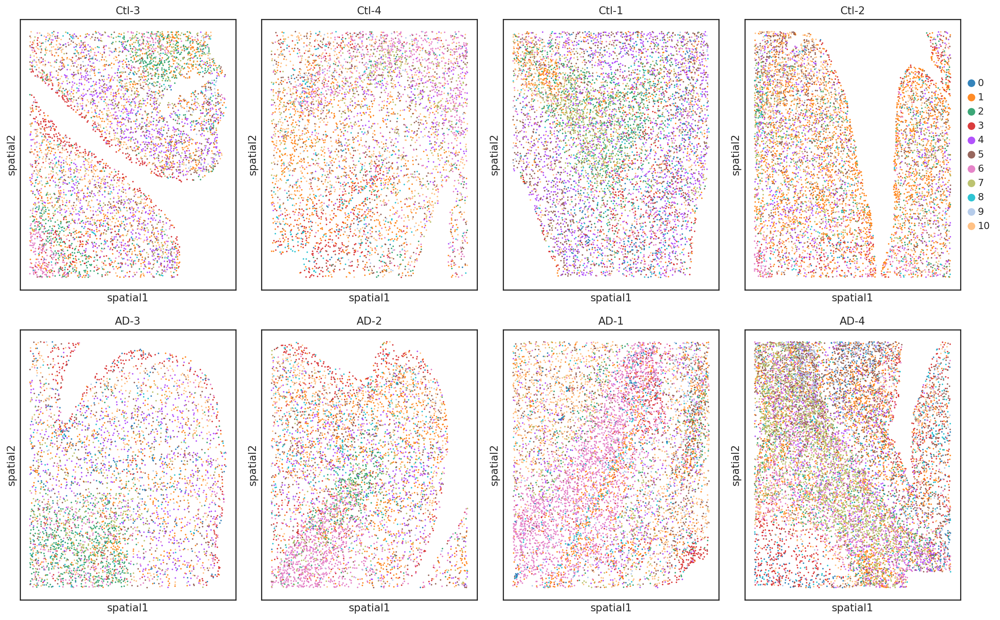

In [17]:
# plot spatila maps
i = 0
j = 0
fig,ax=plt.subplots(2,4,figsize=(16,10))

for im in adataScaled.obs.ImageID.unique():
    ss = adataScaled[(adataScaled.obs.ImageID.isin([im]))]#sc.pp.subsample(adataScaled[adataScaled.obs.leiden!=10],fraction=0.8, copy=True)
    ss.uns['leiden_colors']=[cMapDict[int(x)] for x in range(len(ss.obs.leiden.unique()))]
    print(im, [x for x in sorted(ss.obs.leiden.unique())],len(ss.uns['leiden_colors']))

    if ss.obs.ImageType.values[0] == 'Ctl':
        if i<3:
            sc.pl.scatter(ss, basis='spatial',color=['leiden'],ax=ax[0][i],size=12.0,title=im,alpha=0.9, 
                      show=False,legend_loc='none')
        else:
            sc.pl.scatter(ss, basis='spatial',color=['leiden'],ax=ax[0][i],size=12.0,title=im,alpha=0.9, 
                      show=False)
        i+=1
    else:
        if j<4:
            sc.pl.scatter(ss, basis='spatial',color=['leiden'],ax=ax[1][j],size=12.0,title=im,alpha=0.9,
                          show=False,legend_loc='none')
        else:
            sc.pl.scatter(ss, basis='spatial',color=['leiden'],ax=ax[1][j],size=12.0,title=im,alpha=0.9, show=False)
        j+=1
plt.tight_layout()

Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.
Trying to set attribute `._uns` of view, copying.


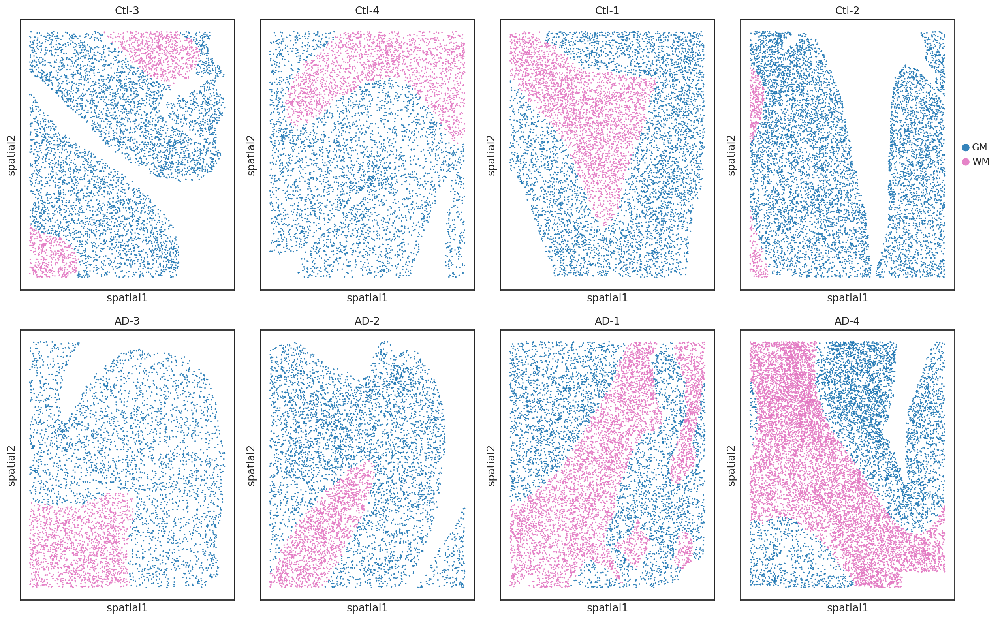

In [18]:
# plot regions
# plot spatila maps
i = 0
j = 0
fig,ax=plt.subplots(2,4,figsize=(16,10))

for im in adataScaled.obs.ImageID.unique():
    ss = adataScaled[(adataScaled.obs.ImageID.isin([im]))]
    cDict = {'GM':'tab:blue','WM':'tab:pink'}
    ss.uns['Region_colors']=[cDict[x] for x in sorted(ss.obs.Region.unique())]
    if ss.obs.ImageType.values[0] == 'Ctl':
        if i<3:
            sc.pl.scatter(ss, basis='spatial',color=['Region'],ax=ax[0][i],size=12.0,title=im,alpha=0.9, 
                      show=False,legend_loc='none',)
        else:
            sc.pl.scatter(ss, basis='spatial',color=['Region'],ax=ax[0][i],size=12.0,title=im,alpha=0.9, 
                      show=False,)
        i+=1
    else:
        if j<4:
            sc.pl.scatter(ss, basis='spatial',color=['Region'],ax=ax[1][j],size=12.0,title=im,alpha=0.9,
                          show=False,legend_loc='none',)
        else:
            sc.pl.scatter(ss, basis='spatial',color=['Region'],ax=ax[1][j],size=12.0,title=im,alpha=0.9,
                          show=False,)
        j+=1
plt.tight_layout()

In [19]:
adataScaled.obs

,spatial_X,spatial_Y,Area,Area (µm^2),ImageID,ImageType,Parent,Distance to nearest Plaque (µm),numCellCentroids,Region,leiden
1790,13574.364621,11980.732852,277,61.1722,Ctl-3,Ctl,Grey Matter,348.1208,1.0,GM,3
1794,13491.046358,11876.990066,302,53.9108,Ctl-3,Ctl,Grey Matter,308.6889,1.0,GM,3
1795,14676.054795,11854.070776,438,82.4693,Ctl-3,Ctl,Grey Matter,432.9919,1.0,GM,2
1796,13395.029412,11854.349790,952,185.9480,Ctl-3,Ctl,Grey Matter,303.5456,1.0,GM,3
1797,15292.282609,11814.693237,828,171.9872,Ctl-3,Ctl,Grey Matter,353.9196,1.0,GM,2
...,...,...,...,...,...,...,...,...,...,...,...
143982,39.883575,15885.947766,1589,269.7662,Ctl-2,Ctl,White Matter,NaN,1.0,WM,6
143983,331.334215,15758.689594,1134,204.2505,Ctl-2,Ctl,White Matter,NaN,1.0,WM,2
143986,140.715271,15603.225616,1015,172.7699,Ctl-2,Ctl,White Matter,NaN,1.0,WM,1
143987,129.878453,15529.645304,1810,347.2530,Ctl-2,Ctl,White Matter,NaN,1.0,WM,6


In [20]:
def plotPie(adt, ax, axis_id):
    count_DF  = adt.obs[adataScaled2.obs.Parent=='Grey Matter'].sample(frac=1).leiden.value_counts()
    keepOrder = count_DF.index
    labels = []
    for ix, x in count_DF.items():
        if (100.*x/count_DF.sum())>=1:
            labels.append("{:.2f}%".format(100.*x/count_DF.sum()))
        else:
            if  "< 1%" not in labels:
                labels.append("< 1%")
            else:
                labels.append("")
    ax[0][axis_id].pie(count_DF,explode=[0.05]*len(adt.obs.leiden.unique()),pctdistance=-0.85,startangle=0,
            labels=labels, colors=[cMapDict[c] for c in keepOrder],
          textprops = {"fontsize":12})
    #plt.set_cmap('Set2')
    #draw circle
    centre_circle = plt.Circle((0,0),0.50,fc='white')
    #fig = plt.gcf()
    ax[0][axis_id].add_artist(centre_circle)
    plt.tight_layout()
    count_DF  = adt.obs[adt.obs.Parent=='White Matter'].sample(frac=1).leiden.value_counts()
    keepOrder = count_DF.index
    labels = []
    for ix, x in count_DF.items():
        if (100.*x/count_DF.sum())>=1:
            labels.append("{:.2f}%".format(100.*x/count_DF.sum()))
        else:
            if  "< 1%" not in labels:
                labels.append("< 1%")
            else:
                labels.append("")
    ax[1][axis_id].pie(count_DF.loc[keepOrder],explode=[0.05]*len(adt.obs.leiden.unique()),pctdistance=-0.85,startangle=0,
            labels=labels, colors=[cMapDict[c] for c in keepOrder],
          textprops = {"fontsize":12})
    #draw circle
    centre_circle = plt.Circle((0,0),0.50,fc='white')
    #fig = plt.gcf()
    ax[1][axis_id].add_artist(centre_circle)

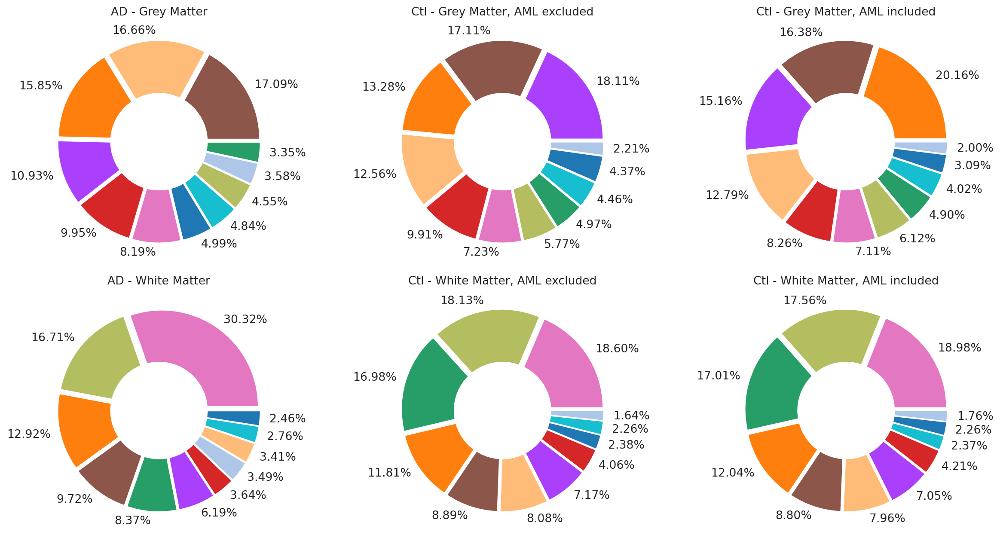

In [21]:
import matplotlib.pyplot as plt
fig,ax=plt.subplots(2,3,figsize=(16,8))
adataScaled2 = adataScaled[adataScaled.obs.ImageType=='AD'].copy()
plotPie(adataScaled2, ax, 0)
ax[0][0].set_title('AD - Grey Matter')
ax[1][0].set_title('AD - White Matter')
plt.tight_layout()

# exclude Ctl-2 sample, which corresponds to a patient with AML
adataScaled2 = adataScaled[adataScaled.obs.ImageID.isin(['Ctl-1','Ctl-3','Ctl-4'])].copy()
plotPie(adataScaled2, ax, 1)
ax[0][1].set_title('Ctl - Grey Matter, AML excluded')
ax[1][1].set_title('Ctl - White Matter, AML excluded')

# plot for all control samples
adataScaled2 = adataScaled[adataScaled.obs.ImageType=='Ctl'].copy()
plotPie(adataScaled2, ax, 2)
ax[0][2].set_title('Ctl - Grey Matter, AML included')
ax[1][2].set_title('Ctl - White Matter, AML included')
plt.tight_layout()

In [22]:
## Plot AD statistics
dt = 'Distance to nearest Plaque (µm)'
ss = adataScaled[(adataScaled.obs.ImageType =='AD')]
ss = ss[ss.obs.Parent=='Grey Matter']
BINS  =[-1,0,5,10,15,20,30,50,75,100,200,500]
out = pd.cut(ss.obs[dt],bins=BINS, right=True)
ss.obs['Quantile'] = out.values
 

Trying to set attribute `.obs` of view, copying.


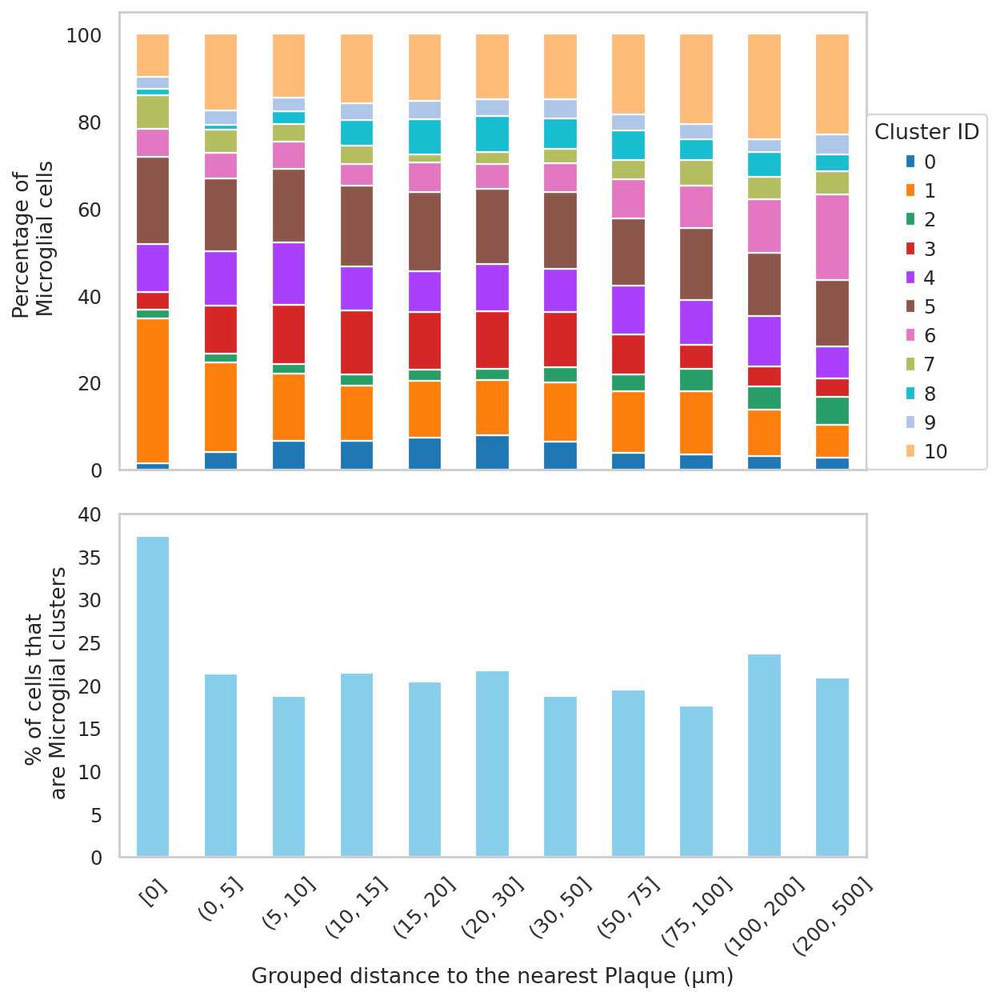

In [28]:


fig,ax = plt.subplots(2,1,figsize=(8,8),gridspec_kw={'height_ratios': [1.6,1.2]})

matpl=sc.pl.matrixplot(ss, var_names = adataScaled.var_names,groupby='Quantile',show=False,vmin=-0.5, vmax=0.75,vcenter=0,
                 dendrogram=False, use_raw=False, cmap="inferno",standard_scale=None,return_fig=True,swap_axes=True)
matpl.legend(show=False)

import numpy as np
sns.set_style("whitegrid", {'axes.grid' : False})


oDF = ss.obs.groupby(['Quantile','leiden','ImageID']).size().T.reset_index().groupby(['Quantile','leiden']).mean().unstack(level=1).T.reset_index(drop=True)
oDFPct = 100*oDF/oDF.sum(axis=0)

oDFPct.T.plot(kind='bar',stacked=True,ax=ax[0],color=cMapDict, legend=True, )
ax[0].legend(title='Cluster ID',loc=(1,0.0))
ax[0].set_ylabel('Percentage of \n Microglial cells')
ax[0].set_xlabel('')
ax[0].set_xticks([])



# find MG dections that are clusters
oDF =100.*ss.obs[ss.obs['numCellCentroids']>1].groupby(['Quantile'])[['numCellCentroids']].size()/ss.obs.groupby(['Quantile'])[['numCellCentroids']].size()

oDFPct = oDF.T#/oDF.sum(axis=1)
oDFPct.T.plot(kind='bar',stacked=True,ax=ax[1], legend=False, color='skyblue')
ax[1].set_ylabel('% of cells that \n are Microglial clusters')
ax[1].set_xlabel('Grouped distance to the nearest Plaque (µm)')
ax[1].set_xticklabels(['[0]']+ax[1].get_xticklabels()[1:],rotation = 45)
ax[1].set_ylim(0,40)

plt.tight_layout()
